<a href="https://colab.research.google.com/github/Tar-ive/ML-projects/blob/main/CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import zipfile


In [2]:
import os
from google.colab import drive

drive.mount('/content/drive')



Mounted at /content/drive


In [3]:

zip_path = '/content/drive/MyDrive/archive (20).zip'


In [4]:
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')  # Specify the path where you want to extract the contents


In [5]:
DIR = '/content/dataset/Dataset/'


In [6]:
import os
import numpy as np # linear algebra
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
from PIL import Image
from sklearn.metrics import classification_report,confusion_matrix
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, load_img, img_to_array
from matplotlib.pyplot import imshow
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import Model
from tensorflow.keras import layers

In [21]:
DIR = '/content/dataset/'


In [22]:
DIR

'/content/dataset/'

In [23]:
files = os.listdir(DIR)
print(files)
class_count = len(files)
print(f'There are {class_count} classes.')

['Dataset', 'actors.txt']
There are 2 classes.


In [24]:
for cls in files:
    cls_path = os.path.join(DIR, cls)
    if os.path.isdir(cls_path):  # Check if it's a directory
        imgs = os.listdir(cls_path)
        img_path = os.path.join(cls_path, imgs[0])
        if os.path.isfile(img_path):  # Check if it's a file
            img = Image.open(img_path)
            print(f'Class {cls} contains {len(imgs)} images of shape {img.size}.')


In [25]:
def train_val_generators():
    """
    Creates the training and validation data generators
    Returns:
        train_generator, validation_generator: tuple containing the generators
    """
    # Instantiate the ImageDataGenerator class, normalize pixel values and set arguments to augment the images 
    datagen = ImageDataGenerator(rescale=1.0/255.0, 
                                 rotation_range=40,
                                 width_shift_range=0.1,
                                 height_shift_range=0.1,
                                 shear_range=0.1,
                                 zoom_range=0.1,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 fill_mode='nearest',
                                 validation_split=0.2)                               
    # Pass in the appropriate arguments to the flow_from_directory method
    train_generator = datagen.flow_from_directory(directory=DIR,
                                                        batch_size=100, 
                                                        class_mode='categorical',
                                                        shuffle=True,
                                                        subset='training',                         
                                                        target_size=(75,75))

    # Pass in the appropriate arguments to the flow_from_directory method
    validation_generator = datagen.flow_from_directory(directory=DIR,
                                                                  batch_size=36, 
                                                                  class_mode='categorical',
                                                                  shuffle = False,
                                                                  subset='validation', 
                                                                  target_size=(75, 75))
    return train_generator, validation_generator

In [26]:
train_generator, validation_generator = train_val_generators()

Found 1309 images belonging to 1 classes.
Found 327 images belonging to 1 classes.


In [13]:
pre_trained_model = tf.keras.applications.inception_v3.InceptionV3(
                                input_shape = (75, 75, 3), 
                                include_top = False, 
                                weights = 'imagenet')
for layer in pre_trained_model.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 0s 0us/step


In [14]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 75, 75, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 37, 37, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 37, 37, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 37, 37, 32)   0           ['batch_normalization[

In [15]:
# Choose `mixed_7` as the last layer of your base model
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 3, 3, 768)


In [16]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = layers.Dense  (class_count, activation='softmax')(x)           

# Append the dense network to the base model
model_transfer = Model(pre_trained_model.input, x) 

# Print the model summary. See your dense network connected at the end.
model_transfer.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 75, 75, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 37, 37, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 37, 37, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 37, 37, 32)   0           ['batch_normalization[0][0]']

In [17]:
model_transfer.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

In [19]:
history1 = model_transfer.fit(train_generator,
                    epochs=50,
                    validation_data=validation_generator
                   )

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/dispatch.py:1176: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


14/14 [==============================] - 24s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 2/50
14/14 [==============================] - 18s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/50
14/14 [==============================] - 19s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 4/50
14/14 [==============================] - 19s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/50
14/14 [==============================] - 19s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/50
14/14 [==============================] - 19s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/50
14/14 [==============================] - 19s 1s/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+0

KeyboardInterrupt: ignored

In [27]:
image_dir = 'Dataset'

In [29]:
image_files = os.listdir(DIR)

IsADirectoryError: ignored

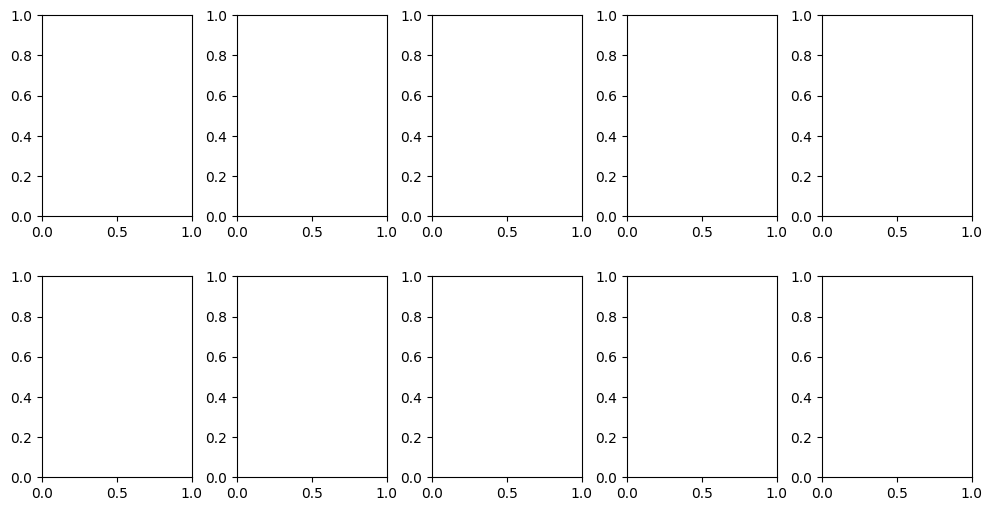

In [32]:
fig, axs = plt.subplots(2, 5, figsize=(12, 6))
fig.subplots_adjust(hspace=0.3, wspace=0.3)
axs = axs.ravel()

for i in range(10):
    image_path = os.path.join(DIR, image_files[i])
    image = Image.open(image_path)
    axs[i].imshow(image)
    axs[i].set_title(f"Image {i+1}")
    axs[i].axis('off')

plt.show()

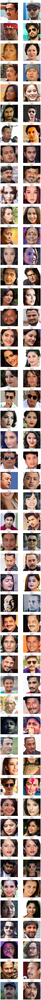

In [40]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Path to the directory containing the images
dataset_dir = '/content/dataset/Dataset/Dataset'

# Get the list of subfolders (class folders) in the dataset directory
class_folders = os.listdir(dataset_dir)

# Display 2 images from each class folder
num_classes = len(class_folders)
fig, axs = plt.subplots(num_classes, 2, figsize=(10, 4 * num_classes))
axs = axs.flatten()  # Flatten the axs array

for i, class_folder in enumerate(class_folders):
    class_path = os.path.join(dataset_dir, class_folder)
    
    if os.path.isdir(class_path):  # Check if it's a directory
        image_files = os.listdir(class_path)
        num_images = min(len(image_files), 2)  # Display 2 images per class
        
        for j in range(num_images):
            image_file = image_files[j]
            image_path = os.path.join(class_path, image_file)
            
            if os.path.isfile(image_path):  # Check if it's a file
                image = Image.open(image_path)
                axs[i*2 + j].imshow(image)
                axs[i*2 + j].set_title(f"Class {i+1}\nImage {j+1}")
                axs[i*2 + j].axis('off')

plt.tight_layout()
plt.show()


In [42]:
from sklearn.model_selection import train_test_split

class_folders = os.listdir(dataset_dir)

# Initialize lists to store images and labels
images = []
labels = []

# Load and preprocess the images
for i, class_folder in enumerate(class_folders):
    class_path = os.path.join(dataset_dir, class_folder)
    
    if os.path.isdir(class_path):  # Check if it's a directory
        image_files = os.listdir(class_path)
        
        for image_file in image_files:
            image_path = os.path.join(class_path, image_file)
            
            if os.path.isfile(image_path):  # Check if it's a file
                # Load the image and resize it to a consistent size
                image = Image.open(image_path)
                image = image.resize((75, 75))
                
                # Convert the image to a numpy array
                image_array = np.array(image)
                
                # Normalize the pixel values
                image_array = image_array / 255.0
                
                # Add the preprocessed image and label to the lists
                images.append(image_array)
                labels.append(i)

# Convert the lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Split the dataset into training and validation sets
train_images, val_images, train_labels, val_labels = train_test_split(
    images, labels, test_size=0.2, stratify=labels, random_state=42
)

In [43]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [44]:
datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=40,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

In [45]:
train_generator = datagen.flow(
    train_images, train_labels, batch_size=100, shuffle=True
)

In [46]:
val_generator = datagen.flow(
    val_images, val_labels, batch_size=36, shuffle=False
)

In [47]:
base_model = InceptionV3(
    input_shape=(75, 75, 3),
    include_top=False,
    weights='imagenet'
)

In [54]:
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(49, activation='softmax')(x)

In [49]:
model = Model(inputs=base_model.input, outputs=output)

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [55]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    min_lr=0.00001,
    verbose=1
)

In [56]:
history = model.fit(
    train_generator,
    epochs=100,
    validation_data=val_generator,
    callbacks=[reduce_lr]
)

Epoch 1/100
14/14 [==============================] - 18s 1s/step - loss: 3.8724 - accuracy: 0.0245 - val_loss: 3.8694 - val_accuracy: 0.0274 - lr: 1.0000e-05
Epoch 2/100
14/14 [==============================] - 15s 1s/step - loss: 3.8775 - accuracy: 0.0260 - val_loss: 3.8687 - val_accuracy: 0.0396 - lr: 1.0000e-05
Epoch 3/100
14/14 [==============================] - 17s 1s/step - loss: 3.8746 - accuracy: 0.0283 - val_loss: 3.8687 - val_accuracy: 0.0274 - lr: 1.0000e-05
Epoch 4/100
14/14 [==============================] - 18s 1s/step - loss: 3.8730 - accuracy: 0.0260 - val_loss: 3.8676 - val_accuracy: 0.0335 - lr: 1.0000e-05
Epoch 5/100
14/14 [==============================] - 15s 1s/step - loss: 3.8697 - accuracy: 0.0329 - val_loss: 3.8693 - val_accuracy: 0.0213 - lr: 1.0000e-05
Epoch 6/100
14/14 [==============================] - 15s 1s/step - loss: 3.8746 - accuracy: 0.0252 - val_loss: 3.8680 - val_accuracy: 0.0488 - lr: 1.0000e-05
Epoch 7/100
14/14 [==============================] -

In [60]:
loss, accuracy = model.evaluate(val_generator)
print("Validation Loss:", loss)
print("Validation Accuracy:", accuracy)

10/10 [==============================] - 6s 630ms/step - loss: 3.8650 - accuracy: 0.0335
Validation Loss: 3.865034580230713
Validation Accuracy: 0.03353658691048622


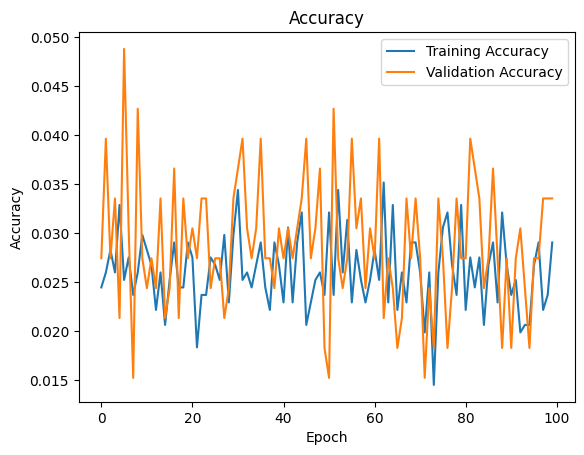

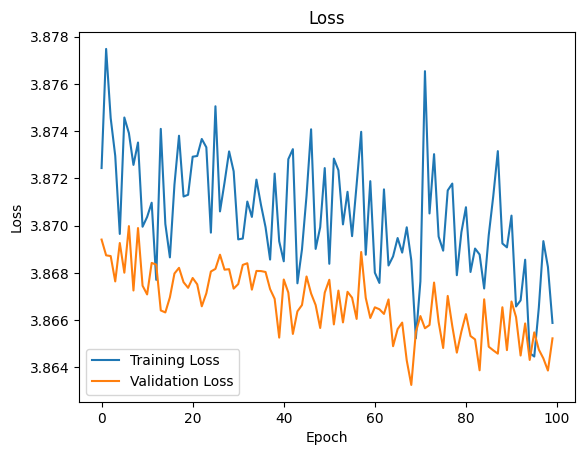

In [61]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()